# **Neural Style Transfer**

### **Imports**

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from google.colab import drive
from IPython import display
from tqdm import tqdm
import os
import glob
import imageio.v2 as imageio

### **Download and preprocess the images**

In [2]:
drive.mount("/content/drive/")

Mounted at /content/drive/


In [3]:
# Images directory
directory_images = "/content/drive/MyDrive/images/neural_style_transfer"

directory_nst = os.path.join(directory_images, "swan_kandinsky")
directory_nst_gif = os.path.join(directory_nst, "images_gif")
os.makedirs(directory_nst_gif, exist_ok=True)

In [7]:
# Download images
content_path = "swan.jpg"
style_path = "kandinsky.jpg"

!wget -q https://cdn.pixabay.com/photo/2017/02/28/23/00/swan-2107052_1280.jpg -O $content_path
!wget -q https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg -O $style_path

**Function to load an image and limit its maximum dimension to max_dim (512) pixels**

In [4]:
def preprocessing(path, max_dim=512):
  img = tf.io.read_file(path)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  scale = max_dim / max(shape)
  new_shape = tf.cast(shape * scale, tf.int32)
  img = tf.image.resize(img, new_shape)

  return img[None, :]

**Function to display and save the images**

In [5]:
def show_and_save_images(content_image, style_image, gen_image=None,
                         epoch=0, save_gif=False, save_img=False, titles=[""]*3):

  content_image = tf.squeeze(content_image)
  style_image = tf.squeeze(style_image)

  if gen_image is not None:
    gen_image = tf.squeeze(gen_image)
    if save_gif:
      plt.imshow(gen_image)
      plt.axis("off")
      plt.savefig(os.path.join(directory_nst_gif, f"image{epoch:02d}.png"), transparent=True)
      plt.close()

    fig, ax = plt.subplots(1, 3, figsize=(15, 4))
    ax[2].imshow(gen_image)
    ax[2].set_title(titles[2])
    ax[2].axis("off")

  else:
    fig, ax = plt.subplots(1, 2, figsize=(10, 4))

  ax[0].imshow(content_image)
  ax[0].set_title(titles[0])
  ax[0].axis("off")

  ax[1].imshow(style_image)
  ax[1].set_title(titles[1])
  ax[1].axis("off")

  if save_img:
    plt.savefig(os.path.join(directory_nst, f"last_image.png"), transparent=True)

  plt.show()

In [8]:
content_image = preprocessing(content_path)
style_image = preprocessing(style_path)

content_image.shape, style_image.shape

(TensorShape([1, 292, 512, 3]), TensorShape([1, 336, 512, 3]))

In [9]:
content_image.numpy().min(), content_image.numpy().max()

(0.0, 1.0)

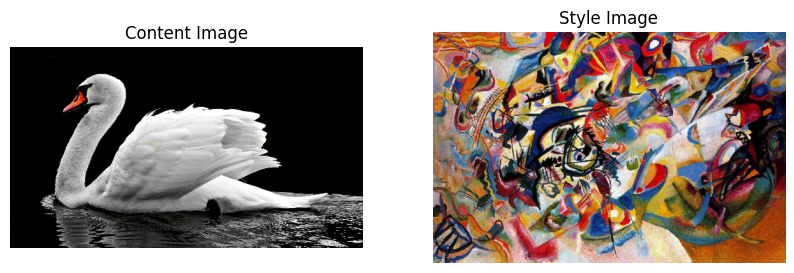

In [10]:
show_and_save_images(content_image, style_image, titles=["Content Image", "Style Image"])

### **Build the model**

In [ ]:
# Viewing the architecture of the VGG19 model
vgg = tf.keras.applications.vgg19.VGG19()
vgg.summary()

del vgg

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

**Define the intermediate layers of the VGG19 model for the style and content representations of the image**

In [11]:
style_layers = ["block1_conv1", "block2_conv1", "block3_conv1", "block4_conv1", "block5_conv1"]
content_layers = ["block5_conv2"]
output_layers = style_layers + content_layers

n_style_layers = len(style_layers)
n_content_layers = len(content_layers)

output_layers

['block1_conv1',
 'block2_conv1',
 'block3_conv1',
 'block4_conv1',
 'block5_conv1',
 'block5_conv2']

**Function to create the model**

In [12]:
def vgg_model(output_layers):
  vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights="imagenet")
  vgg.trainable = False

  input = vgg.input
  outputs = [vgg.get_layer(name).output for name in output_layers]
  model=tf.keras.Model(inputs=input, outputs=outputs)

  return model

In [13]:
vgg = vgg_model(output_layers)
vgg.summary()

80134624/80134624 [==============================] - 1s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                              

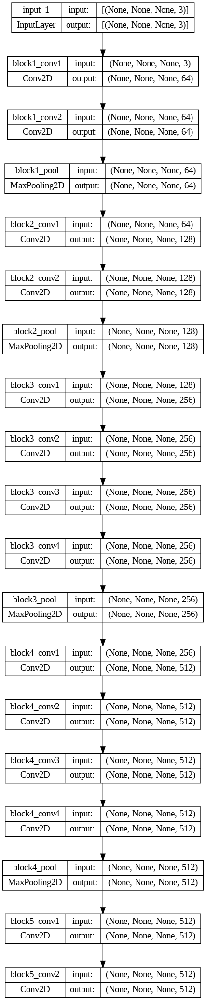

In [ ]:
# Visualizing the architecture of the model
tf.keras.utils.plot_model(vgg, show_shapes=True, show_layer_names=True)

**Gram Matrix**

The style of an image is defined by the interrelationships and correlations among its different feature maps. The Gram matrix captures this information by computing the outer product of the feature vector at each location and averaging these outer products across all locations. This matrix can be efficiently computed for a specific layer using the `tf.linalg.einsum` function. The corresponding formula is:
$$G^l_{cd} = \frac{\sum_{ij} F^l_{ijc}(x)F^l_{ijd}(x)}{IJ}$$

In [14]:
def gram_matrix(style_feature):
  gram = tf.linalg.einsum("bijc,bijd->bcd", style_feature, style_feature)
  shape = tf.shape(style_feature)
  num_locations = tf.cast(shape[1]*shape[2], tf.float32)
  return gram / num_locations

**Functions to get the content and style features**

In [15]:
def style_image_features(generated_style_image):
  image = tf.keras.applications.vgg19.preprocess_input(generated_style_image*255)
  outputs = vgg(image)
  style_features = outputs[:n_style_layers]
  style_features = [gram_matrix(style_feature) for style_feature in style_features]
  return style_features


def content_image_features(generated_content_image):
  image = tf.keras.applications.vgg19.preprocess_input(generated_content_image*255)
  outputs = vgg(image)
  content_features = outputs[n_style_layers:]

  return content_features

### **Train the model**

**Parameters**

In [16]:
style_weight = 1e-2
content_weight = 1e-4
var_weight = 0 # Without applying total variation loss

epochs = 10
steps_per_epoch = 100
optimizer = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

**Loss function**

In [17]:
def style_content_loss(style_features, style_targets, content_features, content_targets,
                       style_weight=style_weight, content_weight=content_weight):

  style_loss = tf.add_n([tf.reduce_mean(tf.square(style_feature - style_target))
                        for style_feature, style_target in zip(style_features, style_targets)])
  style_loss = style_loss * style_weight / n_style_layers

  content_loss = tf.add_n([tf.reduce_mean(tf.square(content_feature - content_target))
                          for content_feature, content_target in zip(content_features, content_targets)])
  content_loss = content_loss * content_weight / n_content_layers

  total_loss = style_loss + content_loss

  return total_loss

**Function to calculate gradients**

In [70]:
@tf.function
def train_step(generated_image, style_targets, content_targets, var_weight):

  with tf.GradientTape() as tape:
    style_features = style_image_features(generated_image)
    content_features = content_image_features(generated_image)
    loss = style_content_loss(style_features, style_targets, content_features, content_targets)

    # Add the total variation loss
    loss += var_weight * tf.image.total_variation(generated_image)

  gradients = tape.gradient(loss, generated_image)
  optimizer.apply_gradients([(gradients, generated_image)])
  generated_image.assign(tf.clip_by_value(generated_image, clip_value_min=0, clip_value_max=1))

  return loss

**Style Transfer**

In [55]:
def fit_style_transfer(style_image, content_image, var_weight=var_weight):
  history = {"loss":[]}
  titles = ["Content Image", "Style Image", "Generated Image"]

  style_targets = style_image_features(style_image)
  content_targets = content_image_features(content_image)
  generated_image = tf.Variable(content_image)

  # Generated image from epoch 0
  show_and_save_images(content_image, style_image, generated_image,
                       save_gif=True, titles=titles)

  for epoch in range(epochs):
    loss_list = []

    with tqdm(range(steps_per_epoch)) as pbar:
      pbar.set_description(f"[Epoch: {epoch+1}/{epochs}]")
      for step in pbar:
        loss = train_step(generated_image, style_targets, content_targets, var_weight)

        loss_list.append(loss.numpy())
        pbar.set_postfix({"loss": loss.numpy()})

    loss_mean = np.mean(loss_list)
    history["loss"].append(loss_mean)

    display.clear_output(wait=True)
    print(f"Epoch {epoch+1}, Loss: {loss_mean}")

    # Examples for training and GIF
    save_img = True if (epoch+1) == epochs else False
    show_and_save_images(content_image, style_image, generated_image,
                         epoch+1, save_gif=True, save_img=save_img, titles=titles)

  return generated_image, history

Epoch 10, Loss: 397690.8125


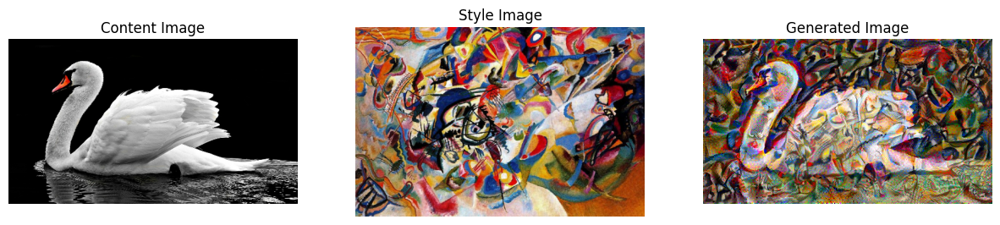

In [ ]:
gen_image, history = fit_style_transfer(style_image, content_image)

In [ ]:
gen_image.shape, gen_image.numpy().min(), gen_image.numpy().max()

(TensorShape([1, 292, 512, 3]), 0.0, 1.0)

**Function to plot the loss**

In [ ]:
def plot_metrics(history, renderer=None, epochs = epochs):
  losses = history["loss"]
  list_epochs = np.arange(1, epochs+1)

  fig=go.Figure()
  fig.add_trace(go.Scatter(x=list_epochs, y=losses, name="Loss", line=dict(color="blue", width=2)))
  fig.update_xaxes(title_text="Epoch")
  fig.update_yaxes(title_text="Loss")
  fig.update_layout(title=f"<b>Evolution of Loss across Epochs</b>",
                    title_font=dict(size=20),
                    title_x=0.5,
                    height=500,
                    width=1200)

  fig.show(renderer)

In [ ]:
# Interactive graphic
plot_metrics(history)

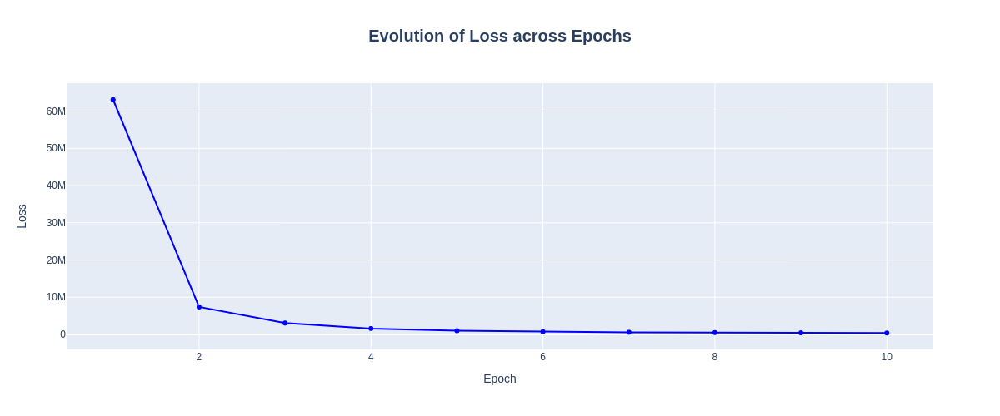

In [ ]:
# Image for GitHub
plot_metrics(history, renderer="png")

**Create a GIF from the generated images**

In [41]:
!pip install tensorflow_docs -q

import tensorflow_docs.vis.embed as embed

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.5/182.5 kB 5.5 MB/s eta 0:00:00


In [42]:
# Function to create gifs

def create_gif(gif_file, images_file, fps=1):
  with imageio.get_writer(gif_file, mode="I", loop=0, fps=fps) as writer:
    filenames = sorted(glob.glob(f"{images_file}/*.png"))
    for filename in filenames:
      image = imageio.imread(filename)
      writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)


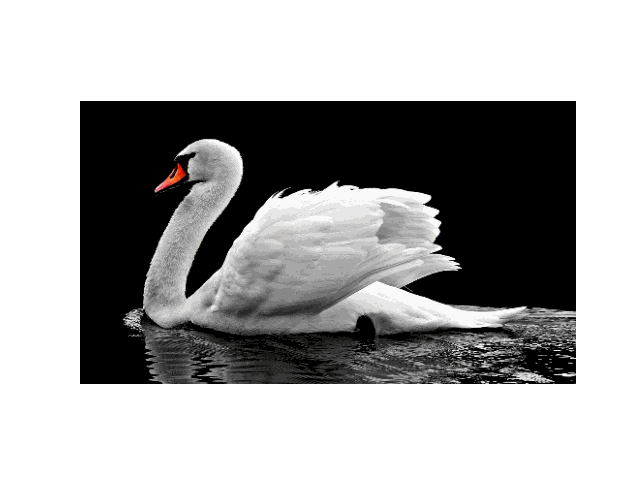

In [ ]:
gif_file = os.path.join(directory_nst, "swan_kandinsky.gif")
create_gif(gif_file, directory_nst_gif, fps=2)
embed.embed_file(gif_file)

### **Total variation loss**

The current implementation produces high-frequency artifacts, which can be reduced using a specific regularization term for the high-frequency components of the image, known as total variation loss. In TensorFlow, this loss is implemented with `tf.image.total_variation`. This function computes the total variation in an image, promoting smoothness and reducing artifacts by penalizing differences between neighboring pixels.

**Seeing the increase in high-frequency components**

In [ ]:
def get_deltas(image):
  x_delta = image[:, :, 1:, :] - image[:, :, :-1, :]
  y_delta = image[:, 1:, :, :] - image[:, :-1, :, :]

  x_delta = tf.clip_by_value(2*x_delta + 0.5, 0, 1)
  y_delta = tf.clip_by_value(2*y_delta + 0.5, 0, 1)

  return x_delta, y_delta

In [ ]:
content_x_deltas, content_y_deltas = get_deltas(content_image)
gen_x_deltas, gen_y_deltas = get_deltas(gen_image)

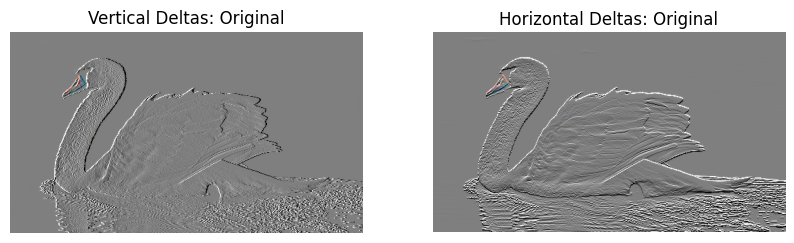

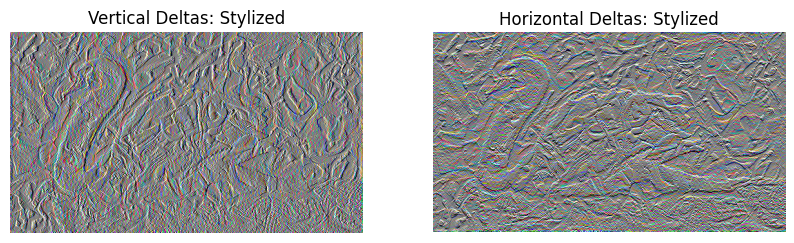

In [ ]:
titles = ["Vertical Deltas: Original", "Horizontal Deltas: Original"]
show_and_save_images(content_x_deltas, content_y_deltas, titles=titles)

titles = ["Vertical Deltas: Stylized", "Horizontal Deltas: Stylized"]
show_and_save_images(gen_x_deltas, gen_y_deltas, titles=titles)

**Applying regularization**

In [ ]:
tf.keras.backend.clear_session()
vgg = vgg_model(output_layers)

In [ ]:
var_weight = 100
optimizer = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

Epoch 10, Loss: 3879297.25


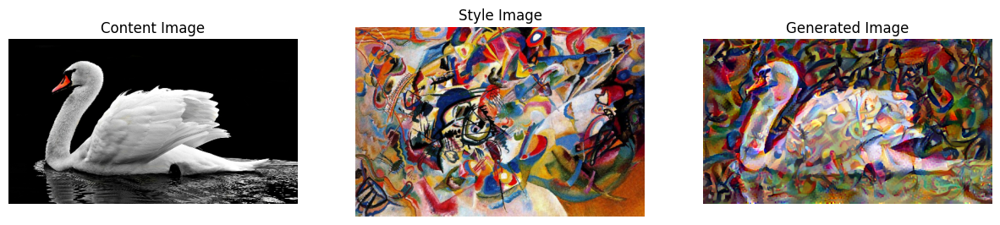

In [ ]:
gen_image_reg, history = fit_style_transfer(style_image, content_image, var_weight=var_weight)

In [ ]:
# Interactive graphic
plot_metrics(history)

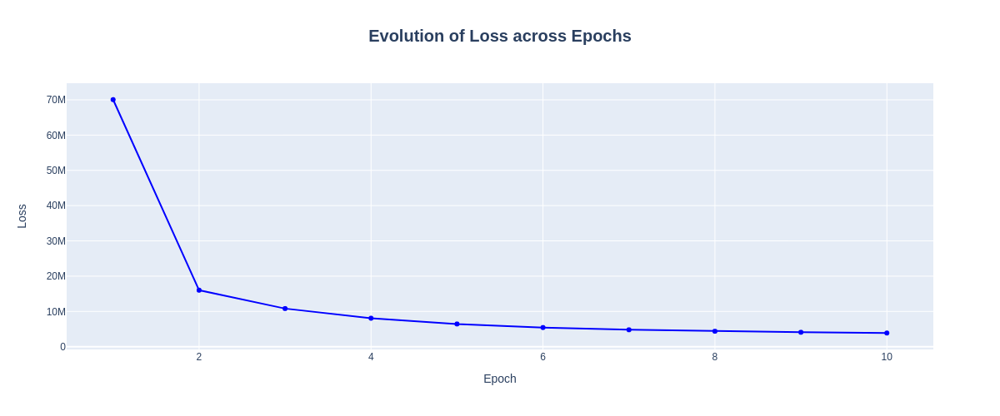

In [ ]:
# Image for GitHub
plot_metrics(history, renderer="png")


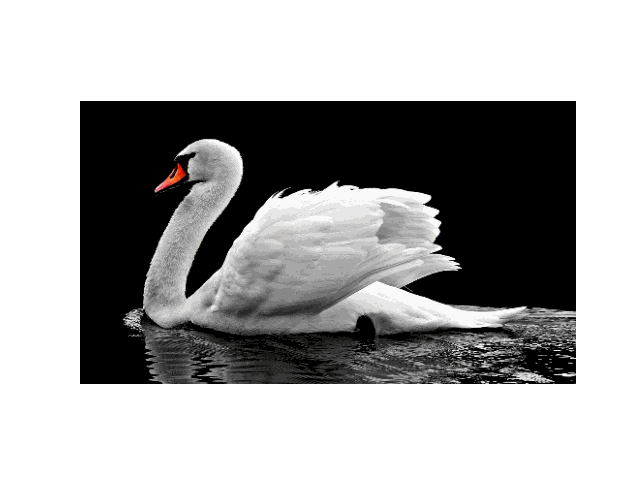

In [ ]:
# create the GIF
gif_file = os.path.join(directory_nst, "swan_kandinsky.gif")
create_gif(gif_file, directory_nst_gif, fps=2)
embed.embed_file(gif_file)

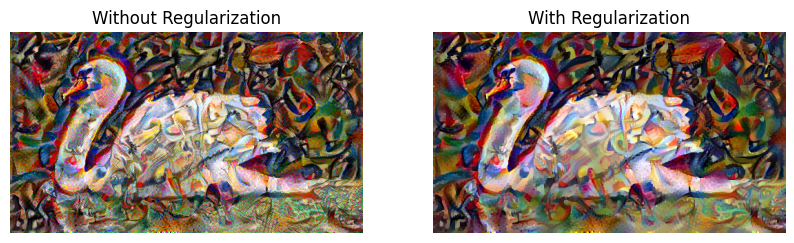

In [ ]:
# Comparing
titles = ["Without Regularization", "With Regularization"]
show_and_save_images(gen_image, gen_image_reg, titles=titles)

---

### **Testing with more images**

**The Persistence of Memory <-- The Starry Night**

In [34]:
directory_nst = os.path.join(directory_images, "persistence_memory_starry_night")
directory_nst_gif = os.path.join(directory_nst, "images_gif")
os.makedirs(directory_nst_gif, exist_ok=True)

In [36]:
content_path = "persistence_memory.jpg"
style_path = "starry_night.jpg"

!wget -q https://e00-expansion.uecdn.es/assets/multimedia/imagenes/2022/03/16/16474305262593.jpg -O $content_path
!wget -q https://e00-expansion.uecdn.es/assets/multimedia/imagenes/2022/03/16/16474297505881.jpg -O $style_path

In [37]:
content_image = preprocessing(content_path)
style_image = preprocessing(style_path)

content_image.shape, style_image.shape

(TensorShape([1, 341, 511, 3]), TensorShape([1, 341, 511, 3]))

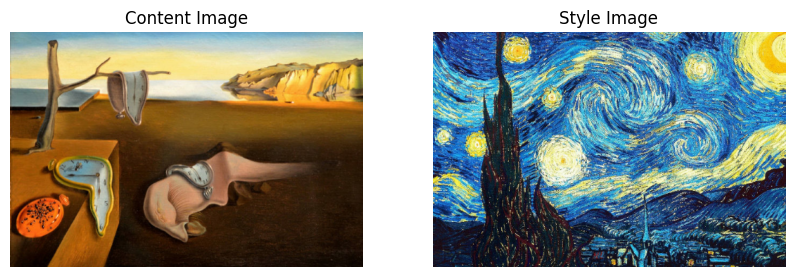

In [38]:
show_and_save_images(content_image, style_image, titles=["Content Image", "Style Image"])

Epoch 10, Loss: 4517721.0


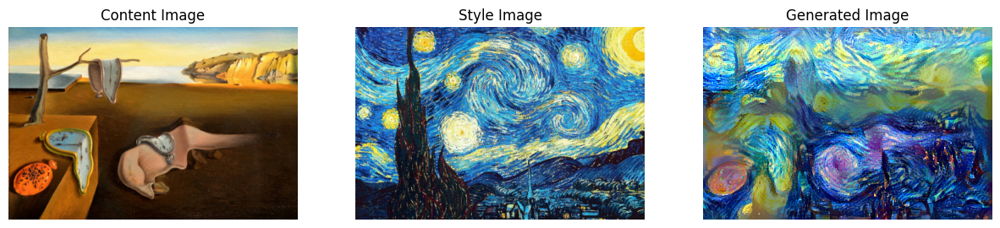

In [39]:
tf.keras.backend.clear_session()
vgg = vgg_model(output_layers)

var_weight = 100
optimizer = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

gen_image, _ = fit_style_transfer(style_image, content_image, var_weight=var_weight)


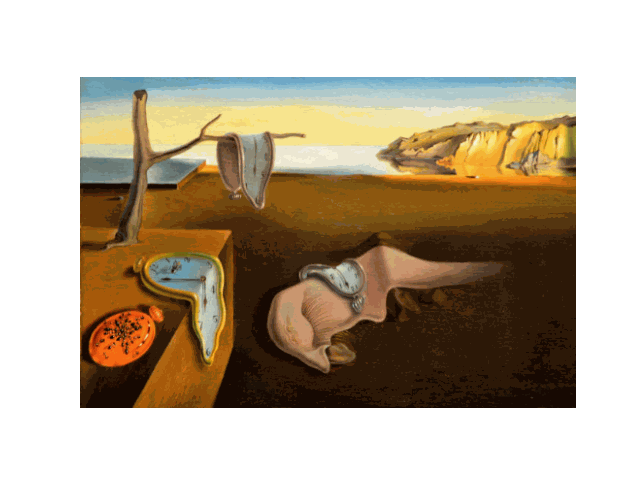

In [43]:
gif_file = os.path.join(directory_nst, "persistence_memory_starry_night.gif")
create_gif(gif_file, directory_nst_gif, fps=2)
embed.embed_file(gif_file)

---

**Mona Lisa <-- Cubism**

In [65]:
directory_nst = os.path.join(directory_images, "mona_lisa_cubism")
directory_nst_gif = os.path.join(directory_nst, "images_gif")
os.makedirs(directory_nst_gif, exist_ok=True)

In [67]:
content_path = "mona_lisa.jpg"
style_path = "cubism.jpg"

!wget -q https://mott.pe/noticias/wp-content/uploads/2018/01/Conoce-la-historia-de-%E2%80%9Cla-Mona-lisa%E2%80%9D-pintura-de-Leonardo-da-Vinci-destacada.jpg -O $content_path
!wget -q https://www.singulart.com/blog/wp-content/uploads/2023/11/Juan-Gris-cubism-1140x760.jpg -O $style_path

In [68]:
content_image = preprocessing(content_path)
style_image = preprocessing(style_path)

content_image.shape, style_image.shape

(TensorShape([1, 341, 512, 3]), TensorShape([1, 341, 512, 3]))

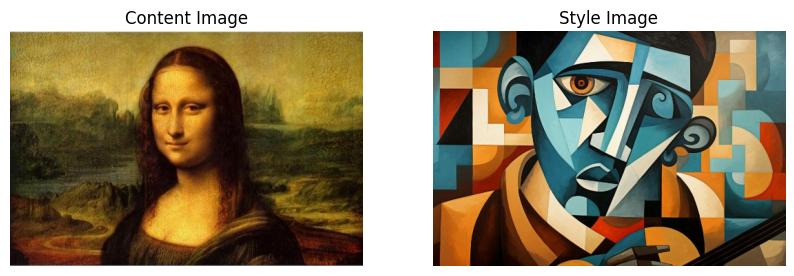

In [69]:
show_and_save_images(content_image, style_image, titles=["Content Image", "Style Image"])

Epoch 10, Loss: 2773255.0


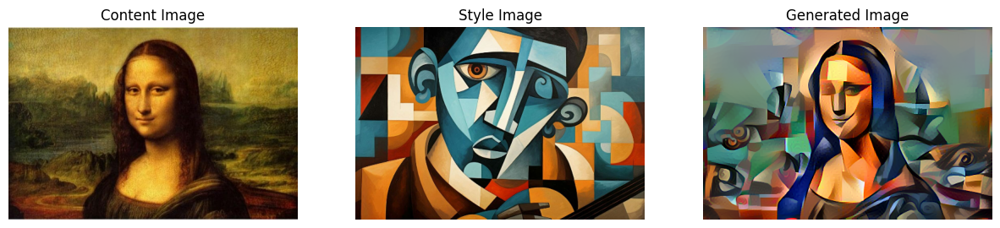

In [71]:
tf.keras.backend.clear_session()
vgg = vgg_model(output_layers)

var_weight = 100
optimizer = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

gen_image, _ = fit_style_transfer(style_image, content_image, var_weight=var_weight)


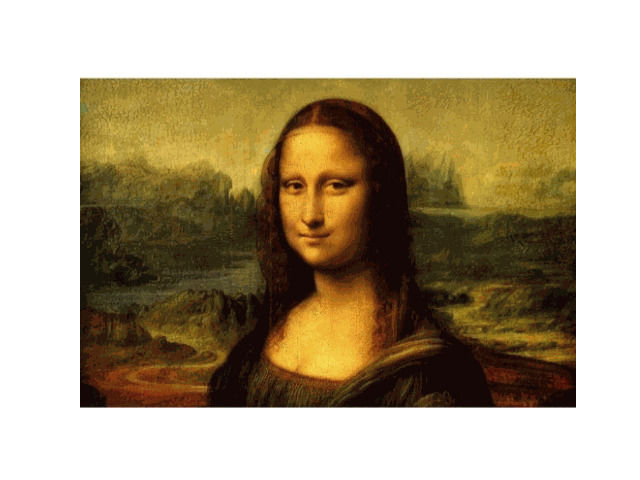

In [72]:
gif_file = os.path.join(directory_nst, "mona_lisa_cubism.gif")
create_gif(gif_file, directory_nst_gif, fps=2)
embed.embed_file(gif_file)